#                                Projet d'analyse exploratoire libre

In [82]:
# to load json files
import json
# datetime oprations
from datetime import timedelta
# to get web contents
from urllib.request import urlopen
# for numerical analyiss
import numpy as np
# to store and process data in dataframe
import pandas as pd
#import pyspark
from pyspark.sql import SparkSession
import calendar
import locale
import datetime
#import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from pyspark.sql import SparkSession
# advanced ploting
import seaborn as sns
# interactive visualization
import plotly.express as px
import plotly.graph_objs as go
# import plotly.figure_factory as ff
from plotly.subplots import make_subplots
# for offline ploting
from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode(connected=True)
# hide warnings
import warnings
warnings.filterwarnings('ignore')
from ipywidgets import interact,widgets
import folium
import matplotlib.pyplot as plt
%matplotlib inline
# Plotting utils
# plot bars with x items and y values
def plotBars(x, y):
    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    ax.bar(x,y)
    plt.show() 
# set size for plots
plt.rcParams['figure.figsize'] = [15, 5]
# Spark init
# create SparkSession
spark = SparkSession.builder.master("local[*]") \
                    .appName('Spark_saad') \
                    .getOrCreate()

# extract SparkContext
sc = spark.sparkContext

print('Spark CPU usage :', sc.defaultParallelism)


Spark CPU usage : 8


In [83]:
# pour le traçage hors ligne
from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode(connected=True)

In [84]:
# masquer les avertissements
import warnings
warnings.filterwarnings('ignore')


In [85]:
# obtenir la dernière version de pip
!pip install --upgrade pip


In [86]:
# pour la carte du calendrier
! pip install calmap


In [87]:
# to convert us statenames to state codes
! pip install us

In [88]:
# pour obtenir le nom du continent à partir du nom du pays
! pip install pycountry_convert

# Charger le premier dataset

In [89]:
country_wise = pd.read_csv('country_wise_latest.csv')
country_wise = country_wise.replace('', np.nan).fillna(0)

In [90]:
country_wise.head(25)

,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,36263,1269,25198,9796,106,10,18,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean
1,Albania,4880,144,2745,1991,117,6,63,2.95,56.25,5.25,4171,709,17.00,Europe
2,Algeria,27973,1163,18837,7973,616,8,749,4.16,67.34,6.17,23691,4282,18.07,Africa
3,Andorra,907,52,803,52,10,0,0,5.73,88.53,6.48,884,23,2.60,Europe
4,Angola,950,41,242,667,18,1,0,4.32,25.47,16.94,749,201,26.84,Africa
5,Antigua and Barbuda,86,3,65,18,4,0,5,3.49,75.58,4.62,76,10,13.16,Americas
6,Argentina,167416,3059,72575,91782,4890,120,2057,1.83,43.35,4.21,130774,36642,28.02,Americas
7,Armenia,37390,711,26665,10014,73,6,187,1.90,71.32,2.67,34981,2409,6.89,Europe
8,Australia,15303,167,9311,5825,368,6,137,1.09,60.84,1.79,12428,2875,23.13,Western Pacific
9,Austria,20558,713,18246,1599,86,1,37,3.47,88.75,3.91,19743,815,4.13,Europe


# On montre les résultats des 10 premiers pays

In [91]:
country_wise.head(10)

,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,36263,1269,25198,9796,106,10,18,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean
1,Albania,4880,144,2745,1991,117,6,63,2.95,56.25,5.25,4171,709,17.00,Europe
2,Algeria,27973,1163,18837,7973,616,8,749,4.16,67.34,6.17,23691,4282,18.07,Africa
3,Andorra,907,52,803,52,10,0,0,5.73,88.53,6.48,884,23,2.60,Europe
4,Angola,950,41,242,667,18,1,0,4.32,25.47,16.94,749,201,26.84,Africa
5,Antigua and Barbuda,86,3,65,18,4,0,5,3.49,75.58,4.62,76,10,13.16,Americas
6,Argentina,167416,3059,72575,91782,4890,120,2057,1.83,43.35,4.21,130774,36642,28.02,Americas
7,Armenia,37390,711,26665,10014,73,6,187,1.90,71.32,2.67,34981,2409,6.89,Europe
8,Australia,15303,167,9311,5825,368,6,137,1.09,60.84,1.79,12428,2875,23.13,Western Pacific
9,Austria,20558,713,18246,1599,86,1,37,3.47,88.75,3.91,19743,815,4.13,Europe


# Voir les informations de chaque pays choisi

In [92]:
country=['Algeria','Morocco' ,'France' , 'Mali']
country_wise[country_wise["Country/Region"].isin(country)]

,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
2,Algeria,27973,1163,18837,7973,616,8,749,4.16,67.34,6.17,23691,4282,18.07,Africa
61,France,220352,30212,81212,108928,2551,17,267,13.71,36.86,37.20,214023,6329,2.96,Europe
107,Mali,2513,124,1913,476,3,1,2,4.93,76.12,6.48,2475,38,1.54,Africa
116,Morocco,20887,316,16553,4018,609,3,115,1.51,79.25,1.91,17562,3325,18.93,Eastern Mediterranean


# a-Charger le dataset day_wise 

In [93]:
day_wise = pd.read_csv('day_wise.csv')
day_wise.head()

,Date,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,No. of countries
0,2020-01-22,555,17,28,510,0,0,0,3.06,5.05,60.71,6
1,2020-01-23,654,18,30,606,99,1,2,2.75,4.59,60.00,8
2,2020-01-24,941,26,36,879,287,8,6,2.76,3.83,72.22,9
3,2020-01-25,1434,42,39,1353,493,16,3,2.93,2.72,107.69,11
4,2020-01-26,2118,56,52,2010,684,14,13,2.64,2.46,107.69,13


# b-Charger dataset full_grouped

In [94]:
full_grouped = pd.read_csv('full_grouped.csv')
full_grouped['Date'] = pd.to_datetime(full_grouped['Date'])

In [95]:
full_grouped.head()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region
0,2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean
1,2020-01-22,Albania,0,0,0,0,0,0,0,Europe
2,2020-01-22,Algeria,0,0,0,0,0,0,0,Africa
3,2020-01-22,Andorra,0,0,0,0,0,0,0,Europe
4,2020-01-22,Angola,0,0,0,0,0,0,0,Africa


# Visualiser les pays les plus touchés

In [96]:
fig=go.FigureWidget(layout=go.Layout())
def highlight_col(x):
  r='background-color:red'
  y='background-color:purple'
  g='background-color:yellow'
  b='background-color:green'
  m='background-color:blue'
  df1=pd.DataFrame('',index=x.index,columns=x.columns)
  df1.iloc[:,6]=y
  df1.iloc[:,2]=r
  df1.iloc[:,3]=g
  df1.iloc[:,1]=b
  df1.iloc[:,5]=m

  return df1

def show_cases(n):
  n=int(n)
  return country_wise.sort_values('Confirmed',ascending=False).head(n).style.apply(highlight_col,axis=None)

interact(show_cases,n='10')

ipywLayout=widgets.Layout(border='solid 2px green')
ipywLayout.display='none'
widgets.VBox([fig],layout=ipywLayout)

interactive(children=(Text(value='10', description='n'), Output()), _dom_classes=('widget-interact',))

    'data': [], 'layout': {'template': '...'}
}),), layout=Layout(border='solid …

# On tri les cas confirmés


In [97]:
etat_class_df= country_wise.sort_values('Confirmed',ascending=False)
etat_class_df.columns

Index(['Country/Region', 'Confirmed', 'Deaths', 'Recovered', 'Active',
       'New cases', 'New deaths', 'New recovered', 'Deaths / 100 Cases',
       'Recovered / 100 Cases', 'Deaths / 100 Recovered',
       'Confirmed last week', '1 week change', '1 week % increase',
       'WHO Region'],
      dtype='object')

# Les 10 pays les plus touchés par coronavirus (cas confirmé)


In [98]:
etat_class_df.columns
px.bar(
   etat_class_df.head(10),
   x= 'Country/Region',
   y= 'Confirmed',
  title='Les 10 pays les plus touchés par coronavirus (cas confirmés)',
  color_discrete_sequence=['pink'],
  height=500,
  width=800
)

# Les 10 pays les plus touchés par coronavirus (cas decès)

In [99]:
etat_class_df.columns
px.bar(
   etat_class_df.head(10),
   x= 'Country/Region',
   y= 'Deaths',
  title='Les 10 pays les plus touchés par coronavirus (cas decès)',
  color_discrete_sequence=['pink'],
  height=500,
  width=800
)

# Les 10 pays les plus touchés par coronavirus (cas rétablis)

In [100]:
etat_class_df.columns
px.bar(
   etat_class_df.head(10),
   x= 'Country/Region',
   y= 'Recovered',
  title='Les 10 pays les plus touchés par coronavirus (cas rétablis)',
  color_discrete_sequence=['pink'],
  height=500,
  width=800
)

# Visualiser les données sur une carte (cas confirmé)



In [101]:
def plot_map(df, col, pal):
    df = df[df[col]>0]
    fig = px.choropleth(df, locations="Country/Region", locationmode='country names', 
                  color=col, hover_name="Country/Region", 
                  title=col, hover_data=[col], color_continuous_scale=pal)
#     fig.update_layout(coloraxis_showscale=False)
    fig.show()

In [102]:
plot_map(country_wise, 'Confirmed', 'matter')

# Visualiser les données sur une carte (cas decès)

In [103]:
plot_map(country_wise, 'Deaths', 'matter')

# Visualiser les données sur une carte (cas decès/100cas)

In [104]:
plot_map(country_wise, 'Deaths / 100 Cases', 'matter')

# Visualiser les données sur une carte(Au cours du temps)

In [105]:
# Over the time

fig = px.choropleth(full_grouped, locations="Country/Region", 
                    color=np.log(full_grouped["Confirmed"]),
                    locationmode='country names', hover_name="Country/Region", 
                    animation_frame=full_grouped["Date"].dt.strftime('%Y-%m-%d'),
                    title='Cases over time', color_continuous_scale=px.colors.sequential.matter)
fig.update(layout_coloraxis_showscale=False)
fig.show()

# Cas confirmé au fil du temps  

In [106]:
def plot_stacked(col):
    fig = px.bar(full_grouped, x="Date", y=col, color='Country/Region', 
                 height=600, title=col, 
                 color_discrete_sequence = px.colors.cyclical.mygbm)
    fig.update_layout(showlegend=True)
    fig.show()

In [107]:
def plot_line(col):
    fig = px.line(full_grouped, x="Date", y=col, color='Country/Region', 
                  height=600, title=col, 
                  color_discrete_sequence = px.colors.cyclical.mygbm)
    fig.update_layout(showlegend=True)
    fig.show()


In [108]:
plot_stacked('Confirmed')

# Visualisation des nouveaux cas au fil du temps par pays  

In [109]:
plot_line('New cases')

# Top 20 des pays avec plus de nouveaux cas


In [110]:
def plot_hbar(df, col, n, hover_data=[]):
    fig = px.bar(df.sort_values(col).tail(n), 
                 x=col, y="Country/Region", color='WHO Region',  
                 text=col, orientation='h', width=700, hover_data=hover_data,
                 color_discrete_sequence = px.colors.qualitative.Dark2)
    fig.update_layout(title=col, xaxis_title="", yaxis_title="", 
                      yaxis_categoryorder = 'total ascending',
                      uniformtext_minsize=8, uniformtext_mode='hide')
    fig.show()

In [111]:
def plot_hbar_wm(col, n, min_pop=1000000, sort='descending'):
    df = worldometer_data[worldometer_data['Population']>min_pop]
    df = df.sort_values(col, ascending=True).tail(n)
    fig = px.bar(df,
                 x=col, y="Country/Region", color='WHO Region',  
                 text=col, orientation='h', width=700, 
                 color_discrete_sequence = px.colors.qualitative.Dark2)
    fig.update_layout(title=col+' (Only countries with > 1M Pop)', 
                      xaxis_title="", yaxis_title="", 
                      yaxis_categoryorder = 'total ascending',
                      uniformtext_minsize=8, uniformtext_mode='hide')
    fig.show()

In [112]:
plot_hbar(country_wise, 'New cases', 20)

# Charger le deuxième Dtaset 

In [113]:
df = pd.read_csv('covid19_tweets.csv')
df.head(30)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False
5,🎹 Franz Schubert,Новоро́ссия,🎼 #Новоро́ссия #Novorossiya #оставайсядома #S...,2018-03-19 16:29:52,1180,1071,1287,False,2020-07-25 12:27:06,#coronavirus #covid19 deaths continue to rise....,"['coronavirus', 'covid19']",Twitter Web App,False
6,hr bartender,"Gainesville, FL",Workplace tips and advice served up in a frien...,2008-08-12 18:19:49,79956,54810,3801,False,2020-07-25 12:27:03,How #COVID19 Will Change Work in General (and ...,"['COVID19', 'Recruiting']",Buffer,False
7,Derbyshire LPC,NaN,NaN,2012-02-03 18:08:10,608,355,95,False,2020-07-25 12:27:00,You now have to wear face coverings when out s...,NaN,TweetDeck,False
8,Prathamesh Bendre,NaN,"A poet, reiki practitioner and a student of law.",2015-04-25 08:15:41,25,29,18,False,2020-07-25 12:26:59,Praying for good health and recovery of @Chouh...,"['covid19', 'covidPositive']",Twitter for Android,False
9,Member of Christ 🇨🇳🇺🇸🇮🇳🇮🇩🇧🇷🇳🇬🇧🇩🇷🇺,👇🏻location at link below👇🏻,"Just as the body is one & has many members, & ...",2014-08-17 04:53:22,55201,34239,29802,False,2020-07-25 12:26:54,POPE AS GOD - Prophet Sadhu Sundar Selvaraj. W...,"['HurricaneHanna', 'COVID19']",Twitter for iPhone,False


# On fait une visualisation des valeurs manquées pour chaque colonne:



In [114]:
missed = round(df.isnull().sum() * 100/ len(df), 2).sort_values()
missed = missed[missed > 0]

missed_df = pd.DataFrame()
missed_df['feature_name'] = missed.index
missed_df['precent'] = missed.values

fig = px.bar(missed_df, 
             x=missed_df['precent'], 
             y=missed_df['feature_name'],
             height=400, width=600,
            title='Pourcentage de valeurs manquées pour chaque colonne (percent > 0)'
            )
fig.show()

# Voyons les utilisateurs le plus de tweets

In [115]:
ds = df['user_name'].value_counts().reset_index()
ds.columns = ['user_name', 'tweets_count']
ds = ds.sort_values(['tweets_count'])

fig = px.bar(
    ds.tail(30), 
    x='tweets_count', 
    y='user_name',
    width=800, 
    height=800,
    title='Top 30 des utilisateurs par nombre de tweets'
    )
fig.show()

# Date et heure exacte des tweets:

In [116]:
pd.to_datetime(df['user_created'])

0        2017-05-26 05:46:42
1        2009-04-16 20:06:23
2        2009-02-28 18:57:41
3        2019-03-07 01:45:06
4        2017-02-12 06:45:15
                 ...        
179103   2013-12-30 18:59:19
179104   2011-12-21 04:41:30
179105   2016-07-13 17:21:59
179106   2009-10-27 17:43:13
179107   2018-04-14 17:30:07
Name: user_created, Length: 179108, dtype: datetime64[ns]

# Voyons comment le coronavirus affecte la création de nouveaux utilisateurs:

In [117]:
df['year_created'] = pd.to_datetime(df['user_created']).dt.year
data = df.drop_duplicates(subset='user_name', keep="first")
data = data[data['year_created']>2006]
data = data['year_created'].value_counts().reset_index()
data.columns = ['year', 'number']

fig = px.bar(
    data, 
    x="year", 
    y="number", 
    orientation='v', 
    title='Utilisateur créé année par année', 
    width=800, 
    height=600
)

fig.show()

# Voyons les 40 emplacements les plus populaires en fonction du nombre de tweets:


In [118]:
ds = df['user_location'].value_counts().reset_index()
ds.columns = ['user_location', 'count']
ds = ds.sort_values(['count'])

fig = px.bar(
    ds.tail(40), 
    x="count", 
    y="user_location", 
    orientation='h', title='Top 40 user locations by number of tweets', 
    width=800, 
    height=800
)

fig.show()

# Il suffit de diviser le jour et l'heure dans des colonnes séparées:

In [119]:
df['date'] = pd.to_datetime(df['date']) 
df = df.sort_values(['date'])
df['day'] = df['date'].astype(str).str.split(' ', expand=True)[0]
df['time'] = df['date'].astype(str).str.split(' ', expand=True)[1]
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,year_created,day,time
17175,Jessica Luther Rummel,"Denton, Texas",Mother. Partner. Scholar. Activist. Alchemist....,2020-07-05 03:28:16,234,28,220,False,2020-07-24 23:47:08,PROTESTORS NEEDED 6PM-10PM DAILY (NOW). 1450 E...,NaN,Twitter Web App,False,2020,2020-07-24,23:47:08
17174,Dr. Lipi #TrustDrFauci Roy,"New York, USA",@NBCNews @MSNBC @Forbes Medical Contributor | ...,2009-10-11 18:46:51,12485,4603,38120,True,2020-07-24 23:47:12,Always honored to speak w @NicolleDWallace abo...,['covid19'],Twitter Web App,False,2009,2020-07-24,23:47:12
17173,Patty Hayes,"Seattle, WA",Director of Public Health - Seattle & King Cou...,2017-07-07 18:56:50,718,162,2276,False,2020-07-24 23:47:12,"Excellent partnership to prevent #COVID19, tha...",['COVID19'],Twitter for Android,False,2017,2020-07-24,23:47:12
17172,Clive Gorman,"Victoria, British Columbia",Marketing Director @CNEGames for @idlechampion...,2011-12-23 02:02:35,597,224,23824,False,2020-07-24 23:47:12,Don't take your eye off the ball. There are st...,['COVID19'],Twitter for Android,False,2011,2020-07-24,23:47:12
17171,Tristyn Russelo,"Alberta, Canada",NaN,2017-06-14 22:01:54,5,68,57,False,2020-07-24 23:47:13,"Apparently, at the Timberlea @saveonfoods stor...",NaN,Twitter Web App,False,2017,2020-07-24,23:47:13


# Maintenant, nous allons vérifier le nombre de tweets pour chaque jour dans notre ensemble de données:


In [120]:
ds = df['day'].value_counts().reset_index()
ds.columns = ['day', 'count']
ds = ds.sort_values('count')
ds['day'] = ds['day'].astype(str) + ':00:00:00'

fig = px.bar(
    ds, 
    x='count', 
    y="day", 
    orientation='h',
    title='Distribution des tweets par jour dans notre dataset ', 
    width=800, 
    height=800
)
fig.show()

# Faisons la même chose mais pour les  heures:

In [121]:
df['hour'] = df['date'].dt.hour
ds = df['hour'].value_counts().reset_index()
ds.columns = ['hour', 'count']
ds['hour'] = 'Hour ' + ds['hour'].astype(str)
fig = px.bar(
    ds, 
    x="hour", 
    y="count", 
    orientation='v', 
    title='Tweets distribution over hours', 
    width=800
)
fig.show()

# Les mots les plus utilisés dans les tweets 

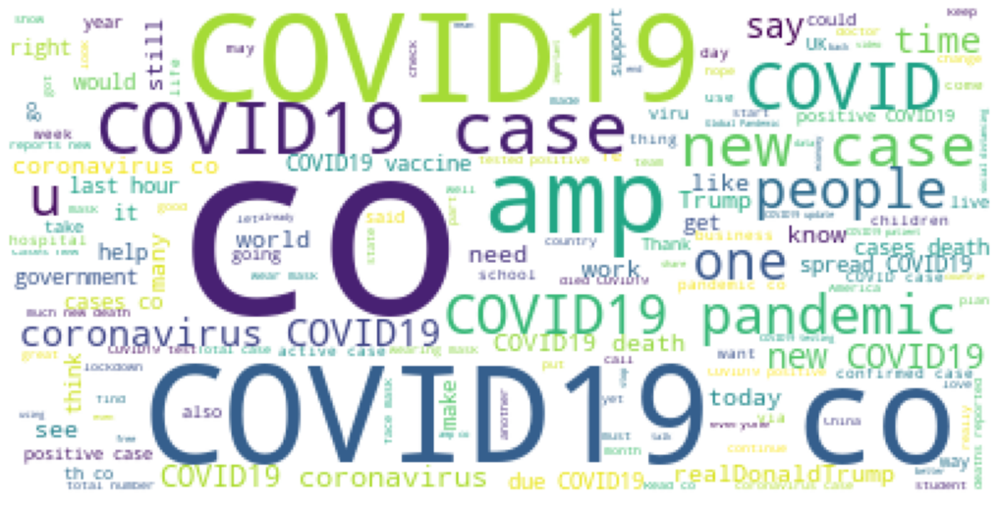

In [44]:
from wordcloud import WordCloud
from PIL import Image

text = ''

for i in range(len(df)):
    text += df.iloc[i,9]

exclude_words = ['http', 'https', 'ourselves', 'hers', 'between', 'yourself', 'but', 'again', 'there', 'about', 
                 'once', 'during', 'out', 'very', 'having', 'with', 'they', 'own', 'an', 'be', 
                 'some', 'for', 'do', 'its', 'yours', 'such', 'into', 'of', 'most', 'itself', 
                 'other', 'off', 'is', 's', 'am', 'or', 'who', 'as', 'from', 'him', 'each', 
                 'the', 'themselves', 'until', 'below', 'are', 'we', 'these', 'your', 'his', 
                 'through', 'don', 'nor', 'me', 'were', 'her', 'more', 'himself', 'this', 
                 'down', 'should', 'our', 'their', 'while', 'above', 'both', 'up', 'to', 
                 'ours', 'had', 'she', 'all', 'no', 'when', 'at', 'any', 'before', 'them', 
                 'same', 'and', 'been', 'have', 'in', 'will', 'on', 'does', 'yourselves', 
                 'then', 'that', 'because', 'what', 'over', 'why', 'so', 'can', 'did', 'not', 
                 'now', 'under', 'he', 'you', 'herself', 'has', 'just', 'where', 'too', 'only', 
                 'myself', 'which', 'those', 'i', 'after', 'few', 'whom', 't', 'being', 'if', 
                 'theirs', 'my', 'against', 'a', 'by', 'doing', 'it', 'how', 'further', 'was', 'here', 'than']
wordcloud = WordCloud(background_color = 'white', stopwords = exclude_words, max_words = 150).generate(text)

plt.figure(figsize=(18,40))
plt.imshow(wordcloud)
plt.axis('off')

plt.show()
